<a href="https://colab.research.google.com/github/EduardoFabeniJohannsen/Ciencia_da_Computacao_UNIVALI/blob/main/Processamento_de_Imagens_M1_Eduardo_F_Johannsen_e_Kauan_D_Leal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Códigos base**

Códigos para extratir asa fotos, bibliotecas e incializadores essenciasis para fazer os exercicios

In [3]:
import os
import glob

import numpy as np
import cv2
import matplotlib.pyplot as plt

# Configuração para exibir imagens maiores por padrão
plt.rcParams['figure.figsize'] = (8, 6)

print("Bibliotecas importadas com sucesso.")
print("NumPy:", np.__version__)
print("OpenCV:", cv2.__version__)

Bibliotecas importadas com sucesso.
NumPy: 2.1.3
OpenCV: 4.14.0


In [4]:
# Caminho da pasta onde as imagens foram enviadas no Colab
DATASET_DIR = "/content/FotosViel"

# Lista todos os arquivos de imagem disponíveis na pasta
extensoes_validas = (".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff")

arquivos_encontrados = [
    f for f in sorted(os.listdir(DATASET_DIR))
    if f.lower().endswith(extensoes_validas)
]

print(f"Total de arquivos encontrados: {len(arquivos_encontrados)}\n")
for nome_arquivo in arquivos_encontrados:
    print(nome_arquivo)

Total de arquivos encontrados: 36

Clear.jpg
Degraded.jpg
barbara.jpg
bell.jpg
bellbw.jpg
bg.jpg
bg1.jpg
blur.jpg
box.png
cameraman.png
canyon.png
clearbw.jpg
contrast.jpg
cubes.png
eye.png
eyeref.png
fg.jpg
fg1.jpg
gamma-corr.png
lena.jpg
lena1.jpg
lena2.jpg
lena3.jpg
mri.png
noir.png
part1.png
part2.png
part3.png
part4.png
pots_flash.jpg
pots_no_flash.jpg
q4.png
q7_1.jpeg
q7_2.jpg
quantize.jpg
sky.png


In [5]:
def carregar_imagem(nome_arquivo, colorida=True):
    """
    Carrega uma imagem da pasta do dataset.
    - nome_arquivo: nome do arquivo dentro de DATASET_DIR (ex: 'lena.jpg')
    - colorida: se True, retorna em RGB; se False, retorna em tons de cinza
    """
    caminho = os.path.join(DATASET_DIR, nome_arquivo)

    if not os.path.exists(caminho):
        raise FileNotFoundError(f"Arquivo não encontrado: {caminho}")

    if colorida:
        img_bgr = cv2.imread(caminho, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    else:
        img = cv2.imread(caminho, cv2.IMREAD_GRAYSCALE)

    return img


def mostrar_imagem(img, titulo="", cmap=None):
    """
    Exibe uma imagem com Matplotlib.
    - Se a imagem tiver 2 dimensões (tons de cinza), usa colormap 'gray' por padrão.
    """
    if cmap is None and img.ndim == 2:
        cmap = "gray"

    plt.imshow(img, cmap=cmap)
    plt.title(titulo)
    plt.axis("off")
    plt.show()


def mostrar_imagens(lista_imgs, titulos, cmap=None, figsize=(14, 5)):
    """
    Exibe várias imagens lado a lado, útil para comparações.
    """
    n = len(lista_imgs)
    plt.figure(figsize=figsize)
    for i, (img, titulo) in enumerate(zip(lista_imgs, titulos)):
        plt.subplot(1, n, i + 1)
        cm = cmap
        if cm is None and img.ndim == 2:
            cm = "gray"
        plt.imshow(img, cmap=cm)
        plt.title(titulo)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

In [6]:
print(f"{'Arquivo':<20} {'Shape':<20} {'Dtype':<10} {'Canais'}")
print("-" * 60)

for nome_arquivo in arquivos_encontrados:
    caminho = os.path.join(DATASET_DIR, nome_arquivo)
    img = cv2.imread(caminho, cv2.IMREAD_UNCHANGED)

    if img is None:
        print(f"{nome_arquivo:<20} ERRO ao carregar")
        continue

    canais = img.shape[2] if img.ndim == 3 else 1
    print(f"{nome_arquivo:<20} {str(img.shape):<20} {str(img.dtype):<10} {canais}")

Arquivo              Shape                Dtype      Canais
------------------------------------------------------------
Clear.jpg            (768, 576, 3)        uint8      3
Degraded.jpg         (768, 576, 3)        uint8      3
barbara.jpg          (1024, 1024)         uint8      1
bell.jpg             (512, 343, 3)        uint8      3
bellbw.jpg           (603, 529, 3)        uint8      3
bg.jpg               (720, 1280, 3)       uint8      3
bg1.jpg              (332, 590, 3)        uint8      3
blur.jpg             (1200, 1600, 3)      uint8      3
box.png              (520, 526, 3)        uint8      3
cameraman.png        (256, 256)           uint8      1
canyon.png           (348, 775, 3)        uint8      3
clearbw.jpg          (859, 762, 3)        uint8      3
contrast.jpg         (1333, 2000, 3)      uint8      3
cubes.png            (187, 221, 4)        uint8      4
eye.png              (1200, 1200, 3)      uint8      3
eyeref.png           (1200, 1200, 3)      uint8      3

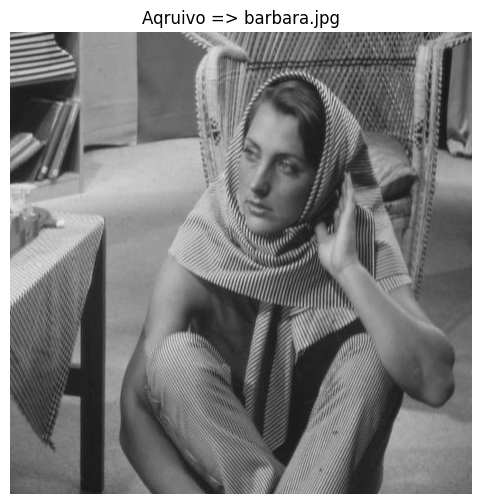

Shape: (1024, 1024, 3)
Dtype: uint8


In [34]:
# Teste rápido!!
# BOte o nome de uma foto pra testar
nome_teste = "barbara.jpg"

img_teste = carregar_imagem(nome_teste, colorida=True)
mostrar_imagem(img_teste, titulo=f"Aqruivo => {nome_teste}")

print("Shape:", img_teste.shape)
print("Dtype:", img_teste.dtype)

## 1. Manipulação de Pixels

Daqui pra baixo resolução do exercicio 1

**a)** função que identifica a cor mais frequente em uma imagem colorida

**b)** função `mergeImage(fg, bg)` que extrai um objeto de primeiro plano e o insere em um plano de fundo.

**c)** testes

In [16]:
def cor_mais_frequente(img):
    """
    Recebe uma imagem colorida (H, W, 3) e retorna:
    - a cor (tupla R, G, B) que mais aparece
    - a quantidade de vezes que ela aparece
    """
    altura, largura = img.shape[0], img.shape[1]

    contagem = {}  # dicionário: chave = (R, G, B), valor = quantidade de ocorrências

    for i in range(altura):
        for j in range(largura):
            pixel = img[i, j]
            cor = (int(pixel[0]), int(pixel[1]), int(pixel[2]))  # tupla imutável, serve como chave

            if cor in contagem:
                contagem[cor] += 1
            else:
                contagem[cor] = 1

    # Encontra a cor com maior contagem percorrendo o dicionário
    cor_predominante = None
    maior_frequencia = 0

    for cor, freq in contagem.items():
        if freq > maior_frequencia:
            maior_frequencia = freq
            cor_predominante = cor

    return cor_predominante, maior_frequencia

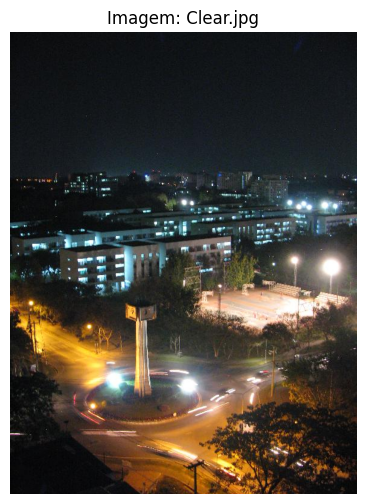

Cor mais frequente (R, G, B): (17, 21, 24)
Frequência: 6738 pixels (1.52% da imagem)


In [20]:
nome_imagem_teste = "Clear.jpg"

img_cor = carregar_imagem(nome_imagem_teste, colorida=True)

cor, frequencia = cor_mais_frequente(img_cor)
total_pixels = img_cor.shape[0] * img_cor.shape[1]
percentual = (frequencia / total_pixels) * 100

mostrar_imagem(img_cor, titulo=f"Imagem: {nome_imagem_teste}")

print(f"Cor mais frequente (R, G, B): {cor}")
print(f"Frequência: {frequencia} pixels ({percentual:.2f}% da imagem)")

### 4.2 mergeImage(fg, bg)

**Estratégia adotada:** como não temos uma máscara de segmentação pronta fornecida, assumimos que a imagem de primeiro plano (`fg`) tem um fundo razoavelmente uniforme (ex: fundo branco, verde ou de cor sólida — como em fotos de estúdio ou objetos fotografados sobre fundo liso). A partir dessa suposição, construímos a máscara da seguinte forma:

1. **Identificar a cor do fundo do `fg`:** reaproveitamos a função `cor_mais_frequente` do item anterior — presumimos que a cor mais frequente em `fg` é o próprio fundo (o que é razoável, já que o fundo geralmente ocupa mais área que o objeto);
2. **Calcular a distância de cada pixel até essa cor de fundo:** usamos distância euclidiana no espaço RGB, `dist = sqrt((R-Rf)² + (G-Gf)² + (B-Bf)²)`, onde `(Rf, Gf, Bf)` é a cor do fundo identificada;
3. **Criar a máscara binária:** pixels com distância maior que um limiar (`limiar`) são considerados objeto (primeiro plano = 1); pixels próximos da cor de fundo são considerados fundo (0);
4. **Inserir o objeto no background:** para cada posição da máscara igual a 1, copiamos o pixel de `fg` para a posição correspondente em `bg` (ajustada por um deslocamento `posicao`); onde a máscara é 0, mantemos o pixel original de `bg`.

**Limitação importante (a comentar na apresentação):** essa abordagem funciona bem quando o fundo do `fg` é uniforme e contrasta com o objeto. Se o fundo do `fg` for muito variado (foto natural complexa), a máscara pode ficar ruidosa — isso é esperado e faz parte da análise a ser feita nos testes.

In [52]:
def mergeImage(fg, bg, limiar=60, offset=(0, 0), proporcao_max=0.9):
    """
    Extrai o objeto em primeiro plano de 'fg' e o insere centralizado em 'bg'.
    - limiar: distância mínima em relação à cor de fundo para considerar objeto
    - offset: (delta_linha, delta_coluna) deslocamento a partir do centro do bg
    - proporcao_max: fração máxima da altura/largura do bg que o objeto pode ocupar (0.9 = 90%)
    """
    resultado = bg.copy()

    # 1. Máscara do objeto (mesma lógica anterior)
    cor_fundo, _ = cor_mais_frequente(fg)
    cor_fundo = np.array(cor_fundo, dtype=np.float64)

    fg_float = fg.astype(np.float64)
    diferenca = fg_float - cor_fundo
    distancia = np.sqrt(np.sum(diferenca ** 2, axis=2))
    mascara_objeto = distancia > limiar

    # 2. Bounding box do objeto
    linhas_com_objeto = np.where(np.any(mascara_objeto, axis=1))[0]
    colunas_com_objeto = np.where(np.any(mascara_objeto, axis=0))[0]

    if len(linhas_com_objeto) == 0 or len(colunas_com_objeto) == 0:
        raise ValueError("Nenhum objeto detectado na máscara. Tente reduzir o 'limiar'.")

    linha_min, linha_max = linhas_com_objeto[0], linhas_com_objeto[-1]
    coluna_min, coluna_max = colunas_com_objeto[0], colunas_com_objeto[-1]

    objeto_recortado = fg[linha_min:linha_max + 1, coluna_min:coluna_max + 1]
    mascara_recortada = mascara_objeto[linha_min:linha_max + 1, coluna_min:coluna_max + 1]

    altura_obj, largura_obj = objeto_recortado.shape[0], objeto_recortado.shape[1]

    # 3. Verifica se o objeto cabe no bg; se não, calcula um fator de escala
    #    que o reduza mantendo a proporção original (altura/largura)
    altura_max = int(resultado.shape[0] * proporcao_max)
    largura_max = int(resultado.shape[1] * proporcao_max)

    escala = min(altura_max / altura_obj, largura_max / largura_obj, 1.0)  # nunca aumenta, só reduz

    if escala < 1.0:
        nova_altura = int(altura_obj * escala)
        nova_largura = int(largura_obj * escala)

        objeto_recortado = cv2.resize(objeto_recortado, (nova_largura, nova_altura),
                                       interpolation=cv2.INTER_AREA)
        # A máscara é binária: usamos interpolação nearest para não criar valores intermediários
        mascara_uint8 = mascara_recortada.astype(np.uint8) * 255
        mascara_uint8 = cv2.resize(mascara_uint8, (nova_largura, nova_altura),
                                    interpolation=cv2.INTER_NEAREST)
        mascara_recortada = mascara_uint8 > 127

        altura_obj, largura_obj = nova_altura, nova_largura

    # 4. Centraliza (com offset) e cola o objeto no bg
    centro_linha = (resultado.shape[0] - altura_obj) // 2 + offset[0]
    centro_coluna = (resultado.shape[1] - largura_obj) // 2 + offset[1]

    for i in range(altura_obj):
        for j in range(largura_obj):
            li = centro_linha + i
            co = centro_coluna + j

            if 0 <= li < resultado.shape[0] and 0 <= co < resultado.shape[1]:
                if mascara_recortada[i, j]:
                    resultado[li, co] = objeto_recortado[i, j]

    return resultado, mascara_objeto

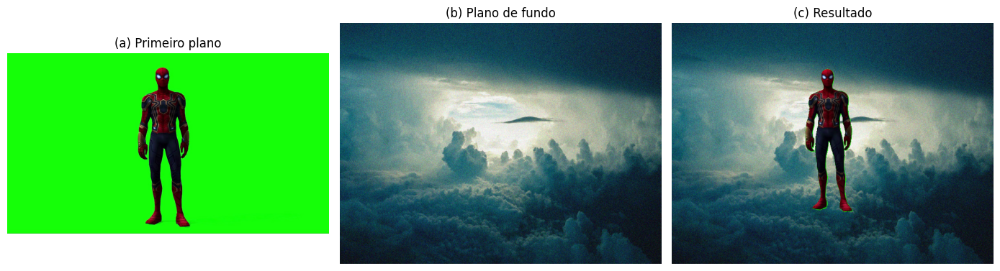

In [53]:
nome_fg = "fg.jpg" # Objeto
nome_bg = "sky.png"  # Fundo

img_fg = carregar_imagem(nome_fg, colorida=True)
img_bg = carregar_imagem(nome_bg, colorida=True)

resultado, mascara = mergeImage(img_fg, img_bg, limiar=60, offset=(0, 0), proporcao_max=0.9)

mostrar_imagens(
    [img_fg, img_bg, resultado],
    ["(a) Primeiro plano", "(b) Plano de fundo", "(c) Resultado"]
)

## 2. Manipulação de Bits

- **a)** função `BitQuantizeImage(im, k)` — quantização de uma imagem de 8 bits para k bits;
- **b)** exibição dos planos de bits de uma imagem em tons de cinza;
- **c)** identificação das operações aplicadas em lena1.jpg, lena2.jpg e lena3.jpg a partir da imagem original lena.jpg.

### A BitQuantizeImage(im, k)

**Fundamento matemático:** uma imagem de 8 bits tem 256 níveis de intensidade (0 a 255). Quantizar para k bits significa reduzir para apenas `2^k` níveis possíveis.

A estratégia é:

1. Calcular quantos "degraus" de intensidade existem no espaço de k bits: `niveis = 2^k`;
2. Calcular o tamanho de cada faixa dentro da escala 0-255: `largura_faixa = 256 / niveis`;
3. Para cada pixel, descobrir em qual faixa ele cai (`pixel // largura_faixa`) — isso nos dá um índice de 0 a `niveis - 1`;
4. Mapear esse índice de volta para a escala 0-255, para a imagem quantizada continuar visualmente comparável à original. Usamos o valor central de cada faixa (`indice * largura_faixa + largura_faixa/2`) em vez do valor mínimo, o que reduz o erro médio de quantização.

Não usamos nenhuma função pronta de quantização — apenas operações aritméticas básicas com NumPy (divisão inteira e multiplicação), que são operações auxiliares, não a implementação do algoritmo em si.

In [55]:
def BitQuantizeImage(im, k):
    """
    Recebe uma imagem de 8 bits (im) e quantiza para k bits.
    - im: imagem em tons de cinza, valores 0-255 (uint8)
    - k: número de bits desejado (1 a 8)
    Retorna a imagem quantizada, ainda representada na escala 0-255 (uint8),
    mas contendo apenas 2^k níveis distintos de intensidade.
    """
    if k < 1 or k > 8:
        raise ValueError("k deve estar entre 1 e 8.")

    im_float = im.astype(np.float64)

    niveis = 2 ** k
    largura_faixa = 256 / niveis

    # Índice da faixa em que cada pixel cai (0 a niveis-1)
    indice_faixa = np.floor(im_float / largura_faixa)

    # Mapeia de volta para a escala 0-255, usando o centro de cada faixa
    im_quantizada = indice_faixa * largura_faixa + largura_faixa / 2

    # Garante que os valores fiquem dentro de 0-255 e no tipo correto
    im_quantizada = np.clip(im_quantizada, 0, 255).astype(np.uint8)

    return im_quantizada

In [9]:
img_quantize = carregar_imagem("quantize.jpg", colorida=False)

valores_k = [8, 4, 2, 1]
imagens_resultado = [img_quantize] + [BitQuantizeImage(img_quantize, k) for k in valores_k[1:]]
titulos = ["Original (8 bits)"] + [f"k = {k} bits ({2**k} níveis)" for k in valores_k[1:]]

mostrar_imagens(imagens_resultado, titulos, cmap="gray", figsize=(16, 4))

NameError: name 'carregar_imagem' is not defined

**Análise:**
A imagem vai perdendo a suaviadde e o degrade nas transições

### B Planos de bits

**Conceito:** cada pixel de uma imagem de 8 bits pode ser escrito em binário, por exemplo `10110100`. Cada uma dessas 8 posições binárias é chamada de "plano de bits" (bit plane). O **bit 7 (mais à esquerda)** é o **MSB (Most Significant Bit)** — carrega o maior peso (128) e é responsável pela informação estrutural principal da imagem. O **bit 0 (mais à direita)** é o **LSB (Least Significant Bit)** — carrega o menor peso (1) e representa detalhes finos/ruído.

**Como extrair um plano de bits:** para extrair o bit `n` de cada pixel, usamos a operação bit a bit **AND** com uma máscara que tem apenas o bit `n` ligado (`2^n`), e depois deslocamos o resultado para que vire 0 ou 1. Multiplicamos por 255 apenas para poder visualizar o plano como uma imagem binária (0 = preto, 255 = branco).

Essa é uma operação bit a bit padrão (`&`, `>>`) — não é uma função pronta que "resolve o exercício", é a própria implementação da extração do plano.

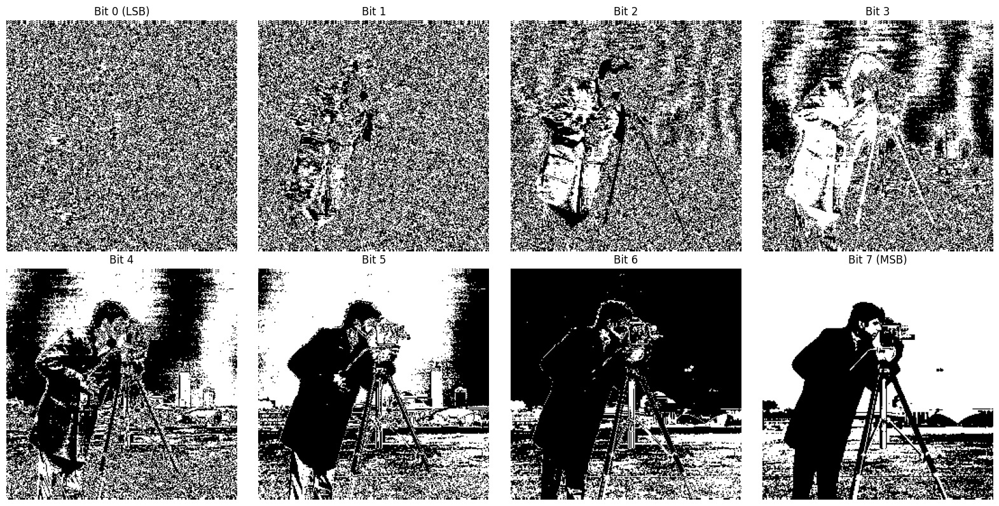

In [57]:
def extrair_plano_de_bit(im, n):
    """
    Extrai o plano de bit n (0 = LSB, 7 = MSB) de uma imagem em tons de cinza de 8 bits.
    Retorna uma imagem binária (0 ou 255) representando esse plano.
    """
    mascara = 1 << n  # desloca o bit 1 para a posição n (ex: n=3 -> 00001000)
    plano = (im & mascara) >> n  # isola o bit n e traz ele para a posição 0 (valor 0 ou 1)
    return (plano * 255).astype(np.uint8)


img_cameraman = carregar_imagem("cameraman.png", colorida=False)

planos = [extrair_plano_de_bit(img_cameraman, n) for n in range(8)]
titulos_planos = [f"Bit {n}" + (" (LSB)" if n == 0 else " (MSB)" if n == 7 else "") for n in range(8)]

# Exibe os 8 planos em um grid 2x4
plt.figure(figsize=(16, 8))
for i in range(8):
    plt.subplot(2, 4, i + 1)
    plt.imshow(planos[i], cmap="gray")
    plt.title(titulos_planos[i])
    plt.axis("off")
plt.tight_layout()
plt.show()

**Análise:** Fazer deppis

### C Análise de lena1.jpg, lena2.jpg e lena3.jpg

Para identificar quais operações foram aplicadas a partir de `lena.jpg`,vamos comparar quantitativamente cada imagem com a original usando três ferramentas:

1. **Histogramas**: mudanças no formato do histograma indicam operações como equalização, quantização (níveis discretos/picos) ou limiarização (binarização);

2. **Diferença absoluta pixel a pixel** entre a original e cada variante: ajuda a ver se a estrutura da imagem foi preservada (diferença pequena e uniforme) ou se houve uma transformação forte (diferença grande e com padrão);

3. **Número de níveis de cinza distintos** em cada imagem: uma imagem binarizada terá só 2 valores; uma quantizada terá poucos níveis; uma equalizada mantém os 256 níveis, mas redistribuídos.

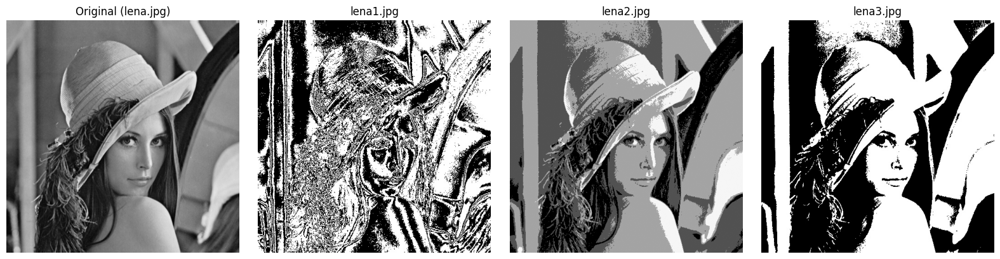

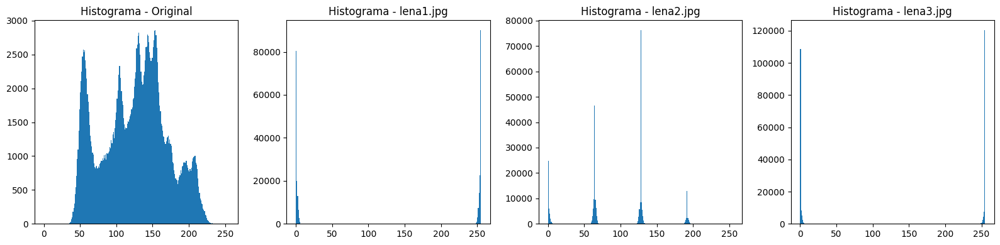

lena1.jpg: 18 níveis de cinza distintos | diferença média em relação à original: 131.46
lena2.jpg: 63 níveis de cinza distintos | diferença média em relação à original: 31.53
lena3.jpg: 18 níveis de cinza distintos | diferença média em relação à original: 90.03


In [58]:
img_lena = carregar_imagem("lena.jpg", colorida=False)
img_lena1 = carregar_imagem("lena1.jpg", colorida=False)
img_lena2 = carregar_imagem("lena2.jpg", colorida=False)
img_lena3 = carregar_imagem("lena3.jpg", colorida=False)

variantes = {"lena1.jpg": img_lena1, "lena2.jpg": img_lena2, "lena3.jpg": img_lena3}

# 1. Exibe as imagens lado a lado
mostrar_imagens(
    [img_lena, img_lena1, img_lena2, img_lena3],
    ["Original (lena.jpg)", "lena1.jpg", "lena2.jpg", "lena3.jpg"],
    figsize=(16, 4)
)

# 2. Exibe os histogramas de cada uma
plt.figure(figsize=(16, 4))
for i, (nome, img) in enumerate([("Original", img_lena)] + list(variantes.items())):
    plt.subplot(1, 4, i + 1)
    plt.hist(img.ravel(), bins=256, range=(0, 255))
    plt.title(f"Histograma - {nome}")
plt.tight_layout()
plt.show()

# 3. Para cada variante: número de níveis distintos e diferença absoluta média em relação à original
for nome, img in variantes.items():
    niveis_distintos = len(np.unique(img))
    diferenca_media = np.mean(np.abs(img.astype(np.int16) - img_lena.astype(np.int16)))
    print(f"{nome}: {niveis_distintos} níveis de cinza distintos | diferença média em relação à original: {diferenca_media:.2f}")

**Análise (com base nos resultados obtidos):**

| Imagem | Níveis distintos | Diferença média | Padrão do histograma |
|---|---|---|---|
| lena1.jpg | 18 | 131.46 | Concentrado nos extremos (perto de 0 e perto de 255), com pouca massa espalhada entre 0-50 |
| lena2.jpg | 63 | 31.53 | Vários picos discretos e regularmente espaçados (perto de 0, 60, 125, 190, 255) |
| lena3.jpg | 18 | 90.03 | Fortemente concentrado em dois picos: um perto de 0 e um pico muito alto perto de 255 |

**lena2.jpg → Quantização de bits (posterização).**
É a imagem com **menor diferença média** em relação à original e a que mantém a aparência geral da Lena reconhecível, só que "em blocos" de tons de cinza (visível nas regiões do chapéu e do fundo, que ficaram com poucos tons uniformes). O histograma reforça isso: em vez de uma distribuição contínua como a original, aparecem **picos discretos e igualmente espaçados** — exatamente o comportamento esperado de uma imagem passada por `BitQuantizeImage` com um k moderado (poucos níveis de cinza possíveis, mas ainda o suficiente para reconhecer a imagem).

**lena1.jpg e lena3.jpg → variações de limiarização/binarização, mas com diferenças entre si.**
Ambas têm o mesmo número de níveis distintos (18) e histogramas concentrados nos extremos (perto de 0 e 255), o que é característico de uma operação de **limiarização (threshold)** — pixels acima de um certo valor viram branco, abaixo viram preto (o "18" em vez de exatamente 2 provavelmente vem de artefatos de compressão JPEG nas bordas da imagem original).

- **lena3.jpg** tem diferença média menor (90.03) e, visualmente, formas mais "limpas" e bem definidas (chapéu e rosto aparecem como blocos sólidos de preto/branco) — consistente com uma **limiarização direta com um único valor de corte** aplicado sobre a imagem original.
- **lena1.jpg** tem diferença média bem maior (131.46) e aparência muito mais ruidosa/texturizada (o fundo com cortina vira um emaranhado de pontos pretos e brancos) — isso sugere que o threshold não foi aplicado diretamente sobre a imagem original, mas sim sobre uma versão da imagem que já realçava textura/ruído antes da binarização (por exemplo, aplicar o threshold sobre um plano de bits baixo — próximo do LSB — que naturalmente já é ruidoso, e não sobre a imagem em tons de cinza original).

**Conclusão resumida:**
- lena.jpg → **lena1.jpg**: limiarização aplicada sobre um plano de baixa ordem (rico em ruído/textura), resultando em binarização "espalhada";
- lena.jpg → **lena2.jpg**: quantização de bits (BitQuantizeImage) com k moderado, reduzindo os tons de cinza em blocos discretos;
- lena.jpg → **lena3.jpg**: limiarização direta (threshold único) sobre a imagem original, produzindo regiões binárias bem definidas.

## 3. Questões Diversas

**a.** O que se pode afirmar sobre o histograma de uma imagem resultante quando mantemos em 0 os bits MSB
no plano de bits?

**b.** O que se pode afirmar sobre o histograma de uma imagem resultante quando mantemos em 0 os bits LSB
no plano de bits?

**c.** A transmissão é geralmente realizada por meio de pacotes que contêm um bit de início, um byte de
informação e um bit de parada. A taxa de transmissão (baud rate) é uma medida comum para a transmissão
de dados digitais e é definida como o número de bits transmitidos por segundo. Quanto tempo seria
necessário para transmitir uma imagem em tons de cinza de 512 × 512 pixels, com intensidades de 0 a
255, por meio de um enlace de 56K baud? Da mesma forma, calcule o tempo necessário para transmitir a
mesma imagem por meio de um enlace de 3000K baud.

# Resposta: A)
Manter os bits MSB em 0 significa apagar os bits de maior peso (128, 64, 32...) e preservar apenas os bits de menor peso (LSB). Isso equivale a fazer uma operação de "resto" sobre a intensidade original: o pixel resultante é sempre um valor pequeno, limitado ao intervalo definido pelos bits que sobraram.

**Efeito no histograma:** o histograma fica **fortemente concentrado próximo de 0**, ocupando apenas uma faixa estreita de intensidades baixas (por exemplo, se restarem apenas os 3 bits menos significativos, os valores só podem variar entre 0 e 7). O contraste visual da imagem cai drasticamente — a imagem fica quase toda escura/preta, porque perdemos justamente os bits responsáveis pela informação estrutural principal (regiões claras e escuras bem definidas). O que sobra é essencialmente ruído de baixa amplitude, sem relação visual clara com o conteúdo original da imagem.

# Resposta: B)
Manter os bits LSB em 0 significa preservar os bits de maior peso (que carregam a forma geral da imagem) e apagar apenas os bits de menor peso. Isso é equivalente a **arredondar/truncar** a intensidade original para o múltiplo mais próximo (para baixo) de uma potência de 2.

**Efeito no histograma:** ao contrário do caso do MSB, o histograma **mantém o mesmo formato geral** do histograma original (mesmos picos e vales, na mesma região do eixo de intensidades), só que ele passa a ser composto por **valores discretos e espaçados regularmente**, em vez de uma distribuição contínua — visualmente, o histograma "afina" e concentra a massa em barras específicas, ao invés de espalhada continuamente. Isso é exatamente o comportamento observado na Seção 5.1 (`BitQuantizeImage`): a imagem continua reconhecível e com o contraste geral preservado, mas com menos níveis de cinza disponíveis (efeito de posterização).

**Diferença central entre os dois casos:** zerar o MSB destrói a estrutura da imagem (perde contraste, fica quase toda escura); zerar o LSB preserva a estrutura e o contraste geral, só reduzindo a suavidade/precisão dos tons (posterização). Isso confirma que a maior parte da informação visualmente relevante de uma imagem está concentrada nos bits mais significativos.

# Resposta: C)
**Dados do problema:**
- Imagem em tons de cinza: 512 × 512 pixels, cada pixel com 8 bits (0-255);
- Cada pacote transmitido contém: 1 bit de início + 1 byte (8 bits) de informação + 1 bit de parada = **10 bits por pixel transmitido**;
- Taxa de transmissão: 56K baud e 3000K baud (1 baud = 1 bit/segundo neste contexto, já que é transmissão serial binária).

**Passo 1 — total de pixels da imagem:**
512 × 512 = 262.144 pixels

**Passo 2 — total de bits realmente transmitidos (incluindo bits de controle):**
Cada pixel gera um pacote de 10 bits (1 início + 8 dados + 1 parada):
262.144 pixels × 10 bits/pixel = 2.621.440 bits

**Passo 3 — tempo para 56K baud:**
56K baud = 56.000 bits/segundo
tempo = 2.621.440 bits ÷ 56.000 bits/s = 46,81 segundos (aproximadamente)

**Passo 4 — tempo para 3000K baud:**
3000K baud = 3.000.000 bits/segundo
tempo = 2.621.440 bits ÷ 3.000.000 bits/s = 0,874 segundos (aproximadamente)

**Calcuo abaixo**

In [1]:
# Dados da imagem
largura, altura = 512, 512
bits_por_pixel_dados = 8   # 1 byte de informação (intensidade 0-255)
bits_controle = 2          # 1 bit de início + 1 bit de parada
bits_por_pacote = bits_por_pixel_dados + bits_controle  # 10 bits por pixel transmitido

total_pixels = largura * altura
total_bits_transmitidos = total_pixels * bits_por_pacote

print(f"Total de pixels: {total_pixels}")
print(f"Bits por pacote (1 início + 8 dados + 1 parada): {bits_por_pacote}")
print(f"Total de bits a transmitir: {total_bits_transmitidos}")
print()

taxas_baud = {"56K baud": 56_000, "3000K baud": 3_000_000}

for nome_taxa, taxa in taxas_baud.items():
    tempo_segundos = total_bits_transmitidos / taxa
    print(f"Tempo para {nome_taxa}: {tempo_segundos:.4f} segundos")

Total de pixels: 262144
Bits por pacote (1 início + 8 dados + 1 parada): 10
Total de bits a transmitir: 2621440

Tempo para 56K baud: 46.8114 segundos
Tempo para 3000K baud: 0.8738 segundos


# 4. Transformação de Histograma



### A) Equalização de histograma

**Fundamento:** a equalização de histograma busca redistribuir as intensidades de uma imagem de forma que o histograma resultante fique o mais "espalhado" (uniforme) possível, aumentando o contraste global.

**Passo a passo do algoritmo:**

1. Calcular o **histograma** da imagem: quantas vezes cada intensidade (0-255) aparece;
2. Calcular a **função de distribuição acumulada (CDF)** do histograma: para cada intensidade `i`, somamos quantos pixels têm intensidade ≤ `i`;
3. **Normalizar** a CDF para a faixa 0-255: essa CDF normalizada é a própria função de mapeamento — ela diz para qual novo valor cada intensidade antiga deve ser transformada;
4. Aplicar esse mapeamento a cada pixel da imagem original.

A CDF tende a "esticar" as regiões do histograma onde há muitos pixels concentrados (fazendo-as ocupar uma faixa maior de intensidades) e "comprimir" as regiões com poucos pixels — daí o aumento de contraste.

In [2]:
def equalizar_histograma(im):
    """
    Aplica equalização de histograma em uma imagem em tons de cinza (8 bits).
    Retorna a imagem equalizada.
    """
    # 1. Histograma: conta quantos pixels existem para cada intensidade 0-255
    histograma, _ = np.histogram(im.ravel(), bins=256, range=(0, 256))

    # 2. CDF (função de distribuição acumulada): soma cumulativa do histograma
    cdf = np.cumsum(histograma)

    # 3. Normaliza a CDF para a faixa 0-255
    #    Usamos o valor mínimo não-nulo da CDF para evitar distorcer a escala com pixels "vazios"
    cdf_min = cdf[cdf > 0].min()
    total_pixels = im.shape[0] * im.shape[1]

    mapeamento = np.round((cdf - cdf_min) / (total_pixels - cdf_min) * 255)
    mapeamento = np.clip(mapeamento, 0, 255).astype(np.uint8)

    # 4. Aplica o mapeamento pixel a pixel (usando indexação vetorizada do NumPy)
    im_equalizada = mapeamento[im]

    return im_equalizada

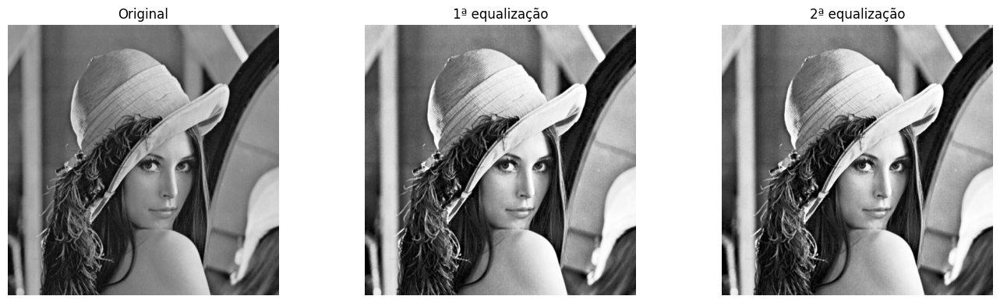

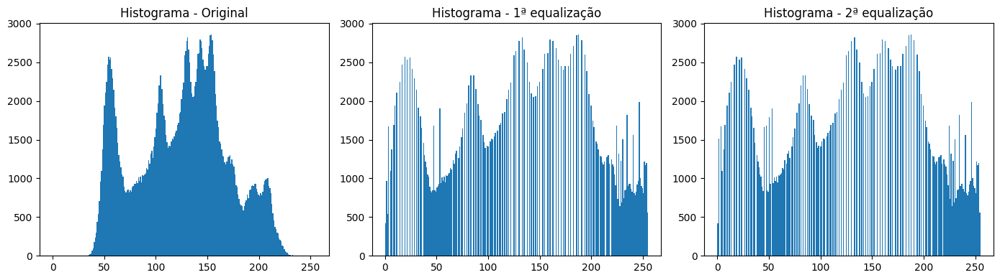

Diferença média entre 1ª e 2ª equalização: 0.1455


In [12]:
nome_imagem = "lena.jpg"
img_original = carregar_imagem(nome_imagem, colorida=False)

img_eq1 = equalizar_histograma(img_original)
img_eq2 = equalizar_histograma(img_eq1)  # equalização aplicada sobre a já equalizada

# Exibe as 3 imagens
mostrar_imagens(
    [img_original, img_eq1, img_eq2],
    ["Original", "1ª equalização", "2ª equalização"],
    cmap="gray", figsize=(14, 4)
)

# Exibe os 3 histogramas correspondentes
plt.figure(figsize=(14, 4))
for i, (titulo, img) in enumerate([("Original", img_original), ("1ª equalização", img_eq1), ("2ª equalização", img_eq2)]):
    plt.subplot(1, 3, i + 1)
    plt.hist(img.ravel(), bins=256, range=(0, 255))
    plt.title(f"Histograma - {titulo}")
plt.tight_layout()
plt.show()

diferenca_eq1_eq2 = np.mean(np.abs(img_eq1.astype(np.int16) - img_eq2.astype(np.int16)))
print(f"Diferença média entre 1ª e 2ª equalização: {diferenca_eq1_eq2:.4f}")

### B) Transformação de histograma entre pares de imagens (histogram matching)

Aqui a tarefa é diferente da equalização: em vez de espalhar o histograma de forma genérica, queremos transformar uma imagem **fonte** para que seu histograma fique parecido com o histograma de uma imagem de **referência**. Essa técnica é chamada de **especificação/casamento de histograma (histogram matching)**.

**Estratégia (implementada manualmente):**

1. Calculamos a CDF da imagem fonte (mesmo processo da equalização, passo 1-3 anterior);
2. Calculamos a CDF da imagem de referência;
3. Para cada nível de intensidade da fonte, buscamos na CDF da referência qual intensidade tem o valor de CDF mais próximo — esse é o valor para o qual a intensidade da fonte deve ser mapeada;
4. Aplicamos esse mapeamento pixel a pixel na imagem fonte.

Reaproveitamos a lógica de CDF já implementada, encapsulando em uma função auxiliar.

In [13]:
def calcular_cdf_normalizada(im):
    """Calcula a CDF normalizada (0 a 1) do histograma de uma imagem em tons de cinza."""
    histograma, _ = np.histogram(im.ravel(), bins=256, range=(0, 256))
    cdf = np.cumsum(histograma).astype(np.float64)
    cdf_normalizada = cdf / cdf[-1]  # normaliza para que o último valor seja 1.0
    return cdf_normalizada


def transformar_histograma(im_fonte, im_referencia):
    """
    Transforma im_fonte para que seu histograma fique parecido com o de im_referencia.
    Retorna a imagem fonte transformada.
    """
    cdf_fonte = calcular_cdf_normalizada(im_fonte)
    cdf_referencia = calcular_cdf_normalizada(im_referencia)

    # Para cada intensidade da fonte (0-255), encontra a intensidade da referência
    # cujo valor de CDF é o mais próximo -> monta a tabela de mapeamento
    mapeamento = np.zeros(256, dtype=np.uint8)
    for intensidade_fonte in range(256):
        valor_cdf = cdf_fonte[intensidade_fonte]
        # Índice da referência cuja CDF mais se aproxima de valor_cdf
        diferenca_absoluta = np.abs(cdf_referencia - valor_cdf)
        intensidade_correspondente = np.argmin(diferenca_absoluta)
        mapeamento[intensidade_fonte] = intensidade_correspondente

    im_transformada = mapeamento[im_fonte]
    return im_transformada

In [16]:
def mostrar_caso_histograma(nome_caso, img_fonte, img_referencia, img_resultado):
    mostrar_imagens(
        [img_fonte, img_referencia, img_resultado],
        [f"Fonte", f"Referência", f"Resultado"],
        cmap="gray", figsize=(12, 4)
    )

    plt.figure(figsize=(12, 3))
    for i, (titulo, img) in enumerate([("Fonte", img_fonte), ("Referência", img_referencia), ("Resultado", img_resultado)]):
        plt.subplot(1, 3, i + 1)
        plt.hist(img.ravel(), bins=256, range=(0, 255))
        plt.title(f"Histograma - {titulo}")
    plt.suptitle(nome_caso)
    plt.tight_layout()
    plt.show()

**Caso 1 — Histogramas semelhantes:**

escolhemos duas imagens do dataset que já têm distribuição de intensidade parecida (por exemplo, duas fotos com iluminação e contraste similares). O esperado é que a transformação altere pouco a imagem fonte, já que os histogramas já são próximos

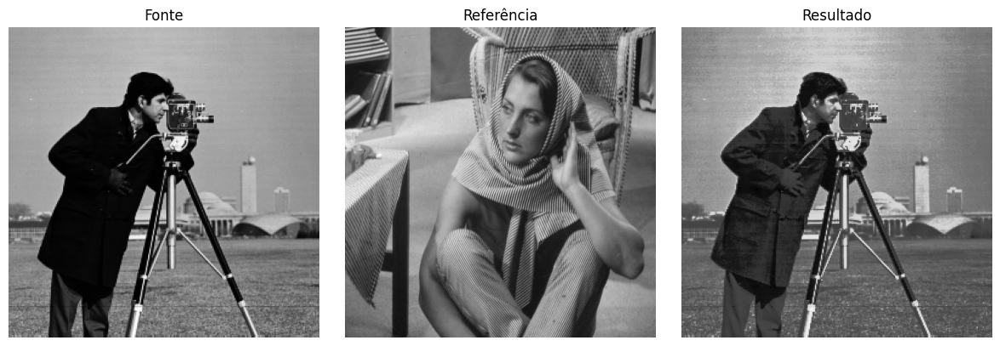

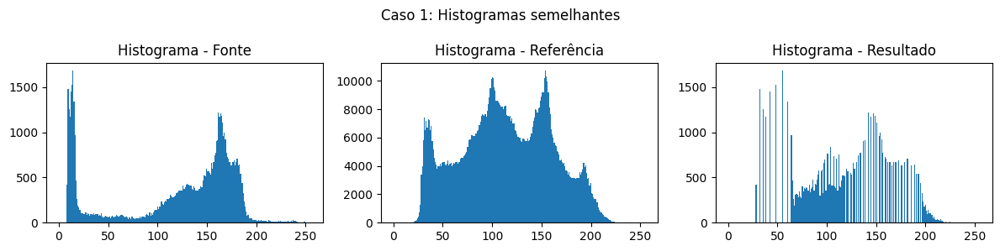

In [15]:
nome_fonte_1 = "cameraman.png"
nome_ref_1 = "barbara.jpg"

img_fonte_1 = carregar_imagem(nome_fonte_1, colorida=False)
img_ref_1 = carregar_imagem(nome_ref_1, colorida=False)
img_resultado_1 = transformar_histograma(img_fonte_1, img_ref_1)

mostrar_caso_histograma("Caso 1: Histogramas semelhantes", img_fonte_1, img_ref_1, img_resultado_1)

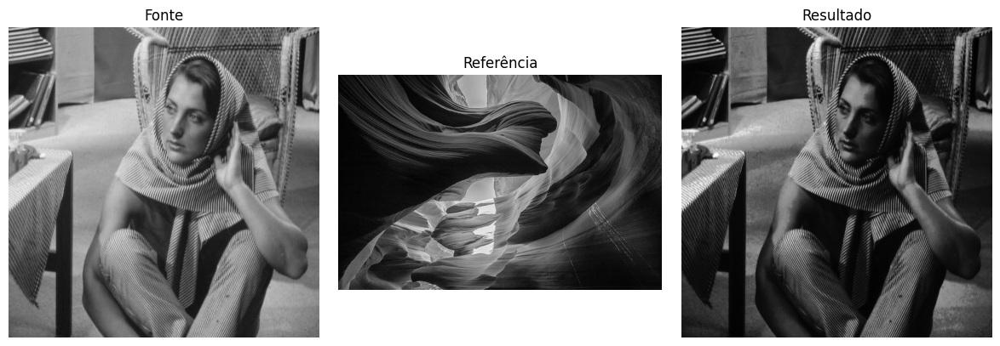

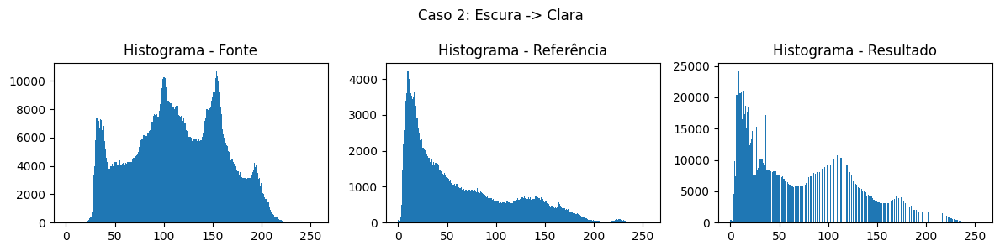

In [17]:
nome_fonte_2 = "barbara.jpg"   # imagem escura
nome_ref_2 = "q7_2.jpg"      # imagem clara

img_fonte_2 = carregar_imagem(nome_fonte_2, colorida=False)
img_ref_2 = carregar_imagem(nome_ref_2, colorida=False)
img_resultado_2 = transformar_histograma(img_fonte_2, img_ref_2)

mostrar_caso_histograma("Caso 2: Escura -> Clara", img_fonte_2, img_ref_2, img_resultado_2)

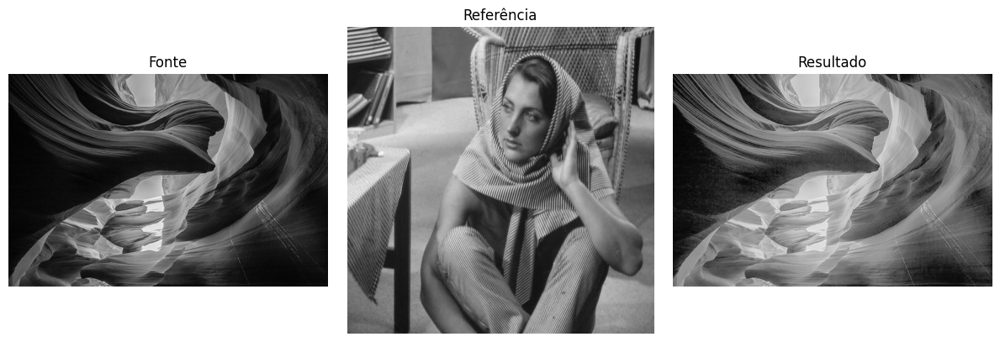

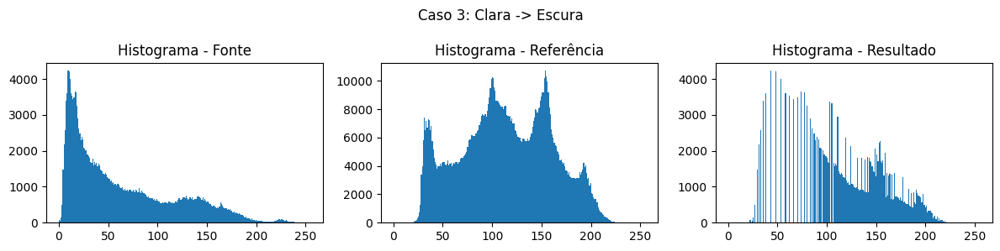

In [19]:
nome_fonte_3 = "q7_2.jpg"    # imagem clara
nome_ref_3 = "barbara.jpg"   # imagem escura

img_fonte_3 = carregar_imagem(nome_fonte_3, colorida=False)
img_ref_3 = carregar_imagem(nome_ref_3, colorida=False)
img_resultado_3 = transformar_histograma(img_fonte_3, img_ref_3)

mostrar_caso_histograma("Caso 3: Clara -> Escura", img_fonte_3, img_ref_3, img_resultado_3)

## 5. Detecção de Bordas

a. Aplique o detector de bordas de Canny (utilize cv2.Canny ou a função edge do MATLAB) às imagens
bell.jpg e cubes.png. Ajuste os valores dos argumentos (minVal e maxVal) e informe os valores que
produzem os melhores resultados para cada imagem.
• Dica: para a imagem bell.jpg, procure detectar o maior número possível de bordas na campainha,

evitando, ao mesmo tempo, as bordas presentes no plano de fundo.
b. Considere os filtros de Roberts, Prewitt e Sobel, bem como os filtros Laplacianos. Aplique esses filtros à
imagem barbara.jpg e faça observações a partir da comparação entre suas saídas. Compare esses
resultados com a saída do detector de bordas de Canny aplicado à mesma imagem.

# A) Detector de Canny

O enunciado autoriza explicitamente o uso de `cv2.Canny`, então usamos a função pronta apenas aqui. O algoritmo de Canny internamente faz: suavização gaussiana, cálculo do gradiente, supressão não-máxima e limiarização por histerese usando dois limiares (`minVal` e `maxVal`) — pixels de gradiente acima de `maxVal` são bordas "fortes", entre `minVal` e `maxVal` são bordas "fracas" (só viram borda se conectadas a uma forte), e abaixo de `minVal` são descartados.

Testamos uma grade de combinações de `minVal`/`maxVal` para cada imagem, escolhendo ao final o par que dá o melhor resultado visual — para `bell.jpg`, buscando maximizar as bordas da campainha e minimizar as do fundo, conforme a dica do enunciado.

In [7]:
def testar_canny(nome_imagem, combinacoes_min_max):
    """
    Aplica Canny em uma imagem para diferentes combinações de (minVal, maxVal)
    e exibe os resultados lado a lado para comparação visual.
    """
    img = carregar_imagem(nome_imagem, colorida=False)

    imagens = [img]
    titulos = ["Original"]

    for min_val, max_val in combinacoes_min_max:
        bordas = cv2.Canny(img, min_val, max_val)
        imagens.append(bordas)
        titulos.append(f"min={min_val}, max={max_val}")

    n = len(imagens)
    plt.figure(figsize=(4 * n, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow(imagens[i], cmap="gray")
        plt.title(titulos[i])
        plt.axis("off")
    plt.tight_layout()
    plt.show()

    return img

Testamos primeiro `bell.jpg` com uma faixa de combinações, começando com valores exploratórios (baixo, médio, alto) para depois refinar.

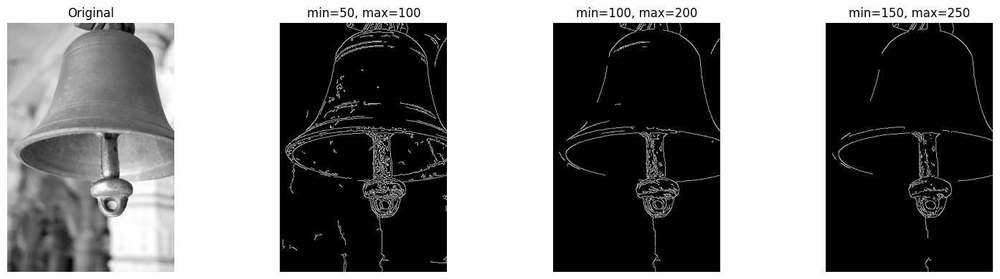

In [8]:
img_bell = testar_canny("bell.jpg", [
    (50, 100),
    (100, 200),
    (150, 250),
])

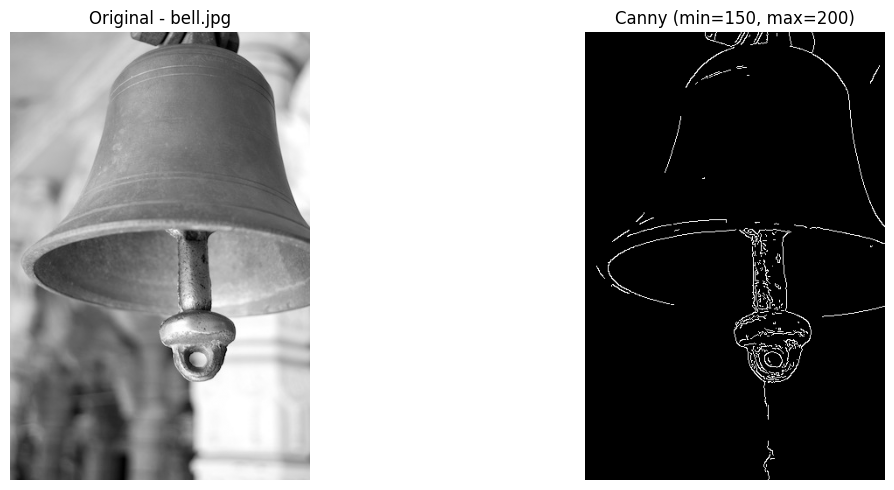

In [9]:
min_val_bell, max_val_bell = 150, 200  #

bordas_bell_final = cv2.Canny(img_bell, min_val_bell, max_val_bell)

mostrar_imagens(
    [img_bell, bordas_bell_final],
    ["Original - bell.jpg", f"Canny (min={min_val_bell}, max={max_val_bell})"]
)

Repetimos o mesmo processo para `cubes.png`.

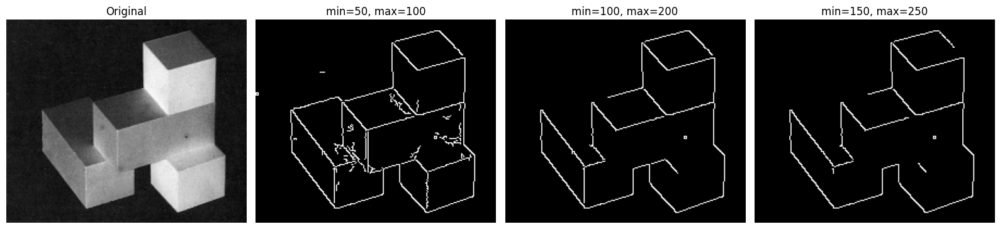

In [10]:
img_cubes = testar_canny("cubes.png", [
    (50, 100),
    (100, 200),
    (150, 250),
])

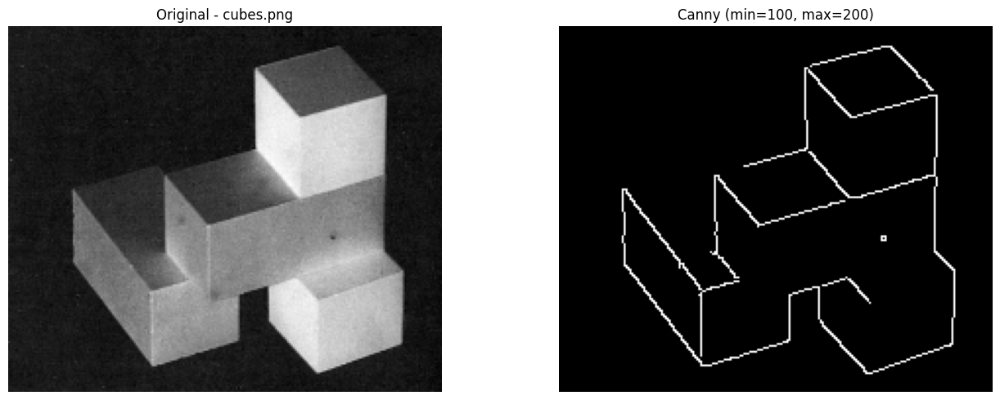

In [11]:
min_val_cubes, max_val_cubes = 100, 200

bordas_cubes_final = cv2.Canny(img_cubes, min_val_cubes, max_val_cubes)

mostrar_imagens(
    [img_cubes, bordas_cubes_final],
    ["Original - cubes.png", f"Canny (min={min_val_cubes}, max={max_val_cubes})"]
)

### 5-B) Roberts, Prewitt, Sobel e Laplaciano (implementação manual)

**Fundamento:** todos esses filtros funcionam por **convolução espacial** — uma máscara pequena (kernel) desliza sobre a imagem, e em cada posição calculamos a soma ponderada dos pixels da vizinhança pelos valores do kernel. Roberts, Prewitt e Sobel são **detectores de gradiente** (estimam a derivada da imagem em X e Y separadamente, depois combinam); o Laplaciano é baseado na **segunda derivada** e usa um único kernel.

**Máscaras utilizadas** (as mesmas fornecidas no enunciado):

- Roberts (2×2): `Mx = [[1,0],[0,-1]]`, `My = [[0,1],[-1,0]]`
- Prewitt (3×3): `Mx = [[-1,0,1],[-1,0,1],[-1,0,1]]`, `My = [[1,1,1],[0,0,0],[-1,-1,-1]]`
- Sobel (3×3): `Mx = [[-1,0,1],[-2,0,2],[-1,0,1]]`, `My = [[1,2,1],[0,0,0],[-1,-2,-1]]`
- Laplaciano (3×3): `[[0,1,0],[1,-4,1],[0,1,0]]` (variante de 4 vizinhos) e `[[1,1,1],[1,-8,1],[1,1,1]]` (variante de 8 vizinhos)

**Implementação da convolução:** escrevemos a convolução manualmente com laços percorrendo cada posição da imagem, aplicando *zero-padding* nas bordas (para a saída ter o mesmo tamanho da entrada) e calculando a soma ponderada da vizinhança pelo kernel em cada posição. Para Roberts, Prewitt e Sobel, calculamos `Gx` (gradiente em X) e `Gy` (gradiente em Y) separadamente, e combinamos com `magnitude = sqrt(Gx² + Gy²)`.

In [13]:
def convolucao_2d(im, kernel):
    """
    Aplica convolução espacial 2D manual entre uma imagem em tons de cinza e um kernel.
    Usa zero-padding para manter o mesmo tamanho de saída.
    Retorna a imagem resultante em float64 (sem normalizar ainda).
    """
    im_float = im.astype(np.float64)
    altura_k, largura_k = kernel.shape

    pad_h = altura_k // 2
    pad_w = largura_k // 2

    im_com_padding = np.pad(im_float, ((pad_h, pad_h), (pad_w, pad_w)), mode="constant")

    altura_img, largura_img = im.shape
    saida = np.zeros((altura_img, largura_img), dtype=np.float64)

    # Kernel invertido (convolução verdadeira, e não correlação) -- para filtros simétricos
    # como os usados aqui, o resultado prático é equivalente, mas mantemos a definição correta
    kernel_invertido = np.flip(kernel)

    for i in range(altura_img):
        for j in range(largura_img):
            regiao = im_com_padding[i:i + altura_k, j:j + largura_k]
            saida[i, j] = np.sum(regiao * kernel_invertido)

    return saida

In [15]:
# Definição dos kernels
kernel_roberts_x = np.array([[1, 0], [0, -1]])
kernel_roberts_y = np.array([[0, 1], [-1, 0]])

kernel_prewitt_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
kernel_prewitt_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])

kernel_sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
kernel_sobel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])

kernel_laplaciano_4 = np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]])
kernel_laplaciano_8 = np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]])


def aplicar_filtro_gradiente(im, kernel_x, kernel_y):
    """Aplica um filtro baseado em gradiente (Roberts/Prewitt/Sobel): calcula Gx, Gy e a magnitude."""
    gx = convolucao_2d(im, kernel_x)
    gy = convolucao_2d(im, kernel_y)
    magnitude = np.sqrt(gx ** 2 + gy ** 2)

    # Normaliza para 0-255 para poder visualizar como imagem
    magnitude_normalizada = np.clip(magnitude, 0, 255).astype(np.uint8)
    return magnitude_normalizada


def aplicar_laplaciano(im, kernel):
    """Aplica o filtro Laplaciano e normaliza o valor absoluto para visualização."""
    resultado = convolucao_2d(im, kernel)
    resultado_normalizado = np.clip(np.abs(resultado), 0, 255).astype(np.uint8)
    return resultado_normalizado

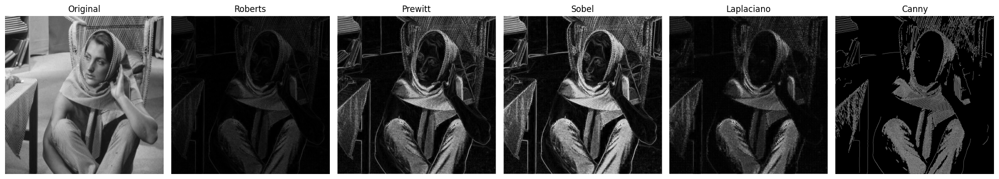

In [16]:
img_barbara = carregar_imagem("barbara.jpg", colorida=False)

bordas_roberts = aplicar_filtro_gradiente(img_barbara, kernel_roberts_x, kernel_roberts_y)
bordas_prewitt = aplicar_filtro_gradiente(img_barbara, kernel_prewitt_x, kernel_prewitt_y)
bordas_sobel = aplicar_filtro_gradiente(img_barbara, kernel_sobel_x, kernel_sobel_y)
bordas_laplaciano = aplicar_laplaciano(img_barbara, kernel_laplaciano_8)
bordas_canny_barbara = cv2.Canny(img_barbara, 100, 200)  # valores iniciais, ajustar se necessário

mostrar_imagens(
    [img_barbara, bordas_roberts, bordas_prewitt, bordas_sobel, bordas_laplaciano, bordas_canny_barbara],
    ["Original", "Roberts", "Prewitt", "Sobel", "Laplaciano", "Canny"],
    cmap="gray", figsize=(20, 4)
)

**Análise:**


- **Roberts:** kernel 2×2, o menor de todos — detecta bordas mas tende a ser mais sensível a ruído pixel-a-pixel, pois considera um
a vizinhança muito pequena; bordas finas e por vezes fragmentadas.
- **Prewitt e Sobel:** kernels 3×3, mais robustos a ruído que Roberts por considerarem uma vizinhança maior. Sobel dá peso maior (2) à linha/coluna central, o que o torna ligeiramente mais suave e com melhor resposta em bordas diagonais que o Prewitt (que usa peso uniforme 1 em toda a linha/coluna).

- **Laplaciano:** por ser baseado na segunda derivada, é **mais sensível a ruído** que os operadores de gradiente (Roberts/Prewitt/Sobel), pois amplifica variações bruscas em qualquer direção simultaneamente (não é direcional); tende a gerar bordas mais finas, mas com mais "sujeira" em áreas de textura.

- **Canny:** produz bordas mais **finas, contínuas e bem definidas** que todos os outros, porque já incorpora suavização (redução de ruído), supressão não-máxima (afinamento) e limiarização por histerese (conecta bordas fracas a fortes) — etapas que os outros filtros não fazem sozinhos.

Preencha com o que você observar na imagem `barbara.jpg` especificamente: qual filtro reagiu mais às texturas do cachecol/calça (regiões de padrão repetitivo, propensas a "confundir" detectores de borda com textura).

### 5 - C) Efeito do ruído gaussiano nos detectores de borda

**Fundamento:** ruído gaussiano é uma perturbação aleatória adicionada a cada pixel, seguindo uma distribuição normal (gaussiana) com média `mu` (geralmente 0, para não deslocar o brilho geral) e desvio padrão `sigma` (controla a intensidade do ruído). Como os detectores de borda funcionam a partir de derivadas (diferenças bruscas entre pixels vizinhos), eles são naturalmente sensíveis a ruído, já que o ruído também cria variações bruscas ponto a ponto — só que sem significado estrutural.

Geramos o ruído com `np.random.normal` (função auxiliar de amostragem estatística, não é uma função de processamento de imagem pronta) e somamos à imagem original, depois aplicamos os mesmos filtros da seção 8.2 sobre a versão ruidosa.

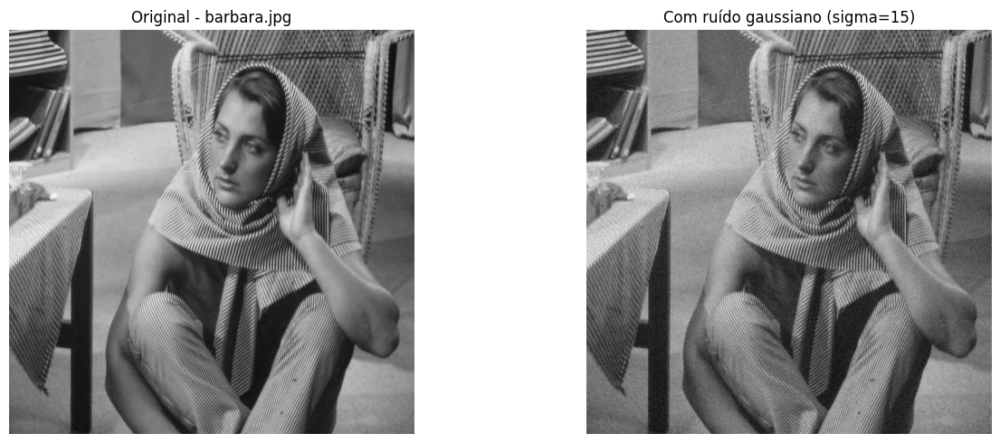

In [17]:
def adicionar_ruido_gaussiano(im, media=0, sigma=15):
    """
    Adiciona ruído gaussiano a uma imagem em tons de cinza.
    - media: valor médio do ruído (0 = não desloca o brilho geral)
    - sigma: desvio padrão do ruído (quanto maior, mais forte o ruído)
    """
    ruido = np.random.normal(media, sigma, im.shape)
    im_ruidosa = im.astype(np.float64) + ruido
    im_ruidosa = np.clip(im_ruidosa, 0, 255).astype(np.uint8)
    return im_ruidosa


img_barbara_ruido = adicionar_ruido_gaussiano(img_barbara, media=0, sigma=15)

mostrar_imagens(
    [img_barbara, img_barbara_ruido],
    ["Original - barbara.jpg", "Com ruído gaussiano (sigma=15)"]
)

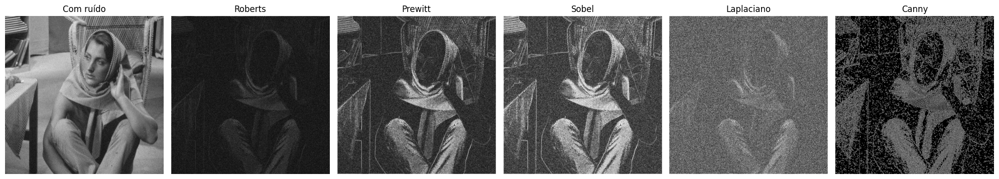

In [18]:
bordas_roberts_ruido = aplicar_filtro_gradiente(img_barbara_ruido, kernel_roberts_x, kernel_roberts_y)
bordas_prewitt_ruido = aplicar_filtro_gradiente(img_barbara_ruido, kernel_prewitt_x, kernel_prewitt_y)
bordas_sobel_ruido = aplicar_filtro_gradiente(img_barbara_ruido, kernel_sobel_x, kernel_sobel_y)
bordas_laplaciano_ruido = aplicar_laplaciano(img_barbara_ruido, kernel_laplaciano_8)
bordas_canny_ruido = cv2.Canny(img_barbara_ruido, 100, 200)

mostrar_imagens(
    [img_barbara_ruido, bordas_roberts_ruido, bordas_prewitt_ruido, bordas_sobel_ruido, bordas_laplaciano_ruido, bordas_canny_ruido],
    ["Com ruído", "Roberts", "Prewitt", "Sobel", "Laplaciano", "Canny"],
    cmap="gray", figsize=(20, 4)
)

## 6. Filtragem High-Boost

- **a)** implementação manual da filtragem high-boost, aplicada em bell.jpg, variando tamanho de janela e fator de ponderação;
- **b)** repetição do exercício em outra imagem escolhida;
- **c)** comparação conceitual entre filtragem high-boost e filtragem bilateral.

In [19]:
def filtro_high_boost(im, tamanho_janela=3, A=1.5):
    """
    Aplica filtragem high-boost em uma imagem em tons de cinza.
    - tamanho_janela: tamanho do kernel de suavização (n x n), deve ser ímpar
    - A: fator de ponderação (A=1 equivale a apenas realçar bordas; quanto maior, mais forte o realce)
    """
    # Kernel de média (filtro passa-baixa simples)
    kernel_media = np.ones((tamanho_janela, tamanho_janela)) / (tamanho_janela ** 2)

    im_float = im.astype(np.float64)
    im_suavizada = convolucao_2d(im, kernel_media)

    im_high_boost = A * im_float - im_suavizada
    im_high_boost = np.clip(im_high_boost, 0, 255).astype(np.uint8)

    return im_high_boost

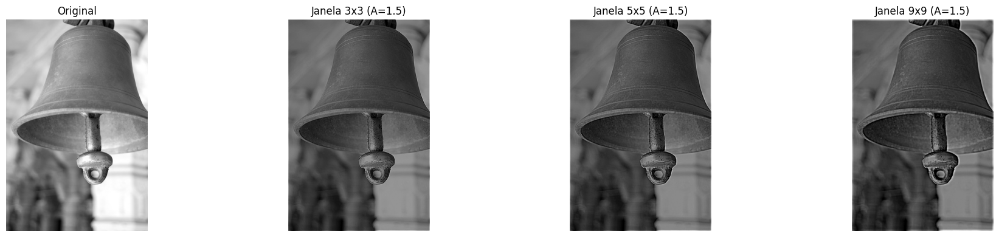

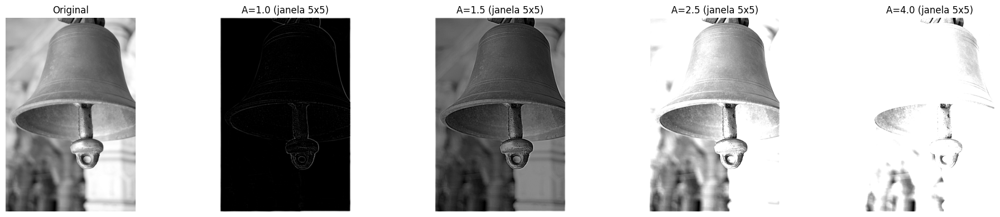

In [20]:
img_bell_gray = carregar_imagem("bell.jpg", colorida=False)

# Variação do tamanho da janela (A fixo)
janelas = [3, 5, 9]
resultados_janela = [filtro_high_boost(img_bell_gray, tamanho_janela=j, A=1.5) for j in janelas]

mostrar_imagens(
    [img_bell_gray] + resultados_janela,
    ["Original"] + [f"Janela {j}x{j} (A=1.5)" for j in janelas],
    cmap="gray", figsize=(20, 4)
)

# Variação do fator de ponderação A (janela fixa)
valores_A = [1.0, 1.5, 2.5, 4.0]
resultados_A = [filtro_high_boost(img_bell_gray, tamanho_janela=5, A=a) for a in valores_A]

mostrar_imagens(
    [img_bell_gray] + resultados_A,
    ["Original"] + [f"A={a} (janela 5x5)" for a in valores_A],
    cmap="gray", figsize=(20, 4)
)

**Análise:**

**Efeito do tamanho da janela:** quanto maior a janela de suavização, mais "grossa" fica a estimativa de baixa frequência subtraída da imagem, então a máscara de nitidez captura detalhes em uma escala espacial maior — o realce passa a atuar sobre estruturas maiores da campainha (o contorno geral do objeto), em vez de só as bordas finas. Em contrapartida, janelas maiores custam mais processamento (mais multiplicações por pixel na convolução) e podem introduzir mais artefato de halo (uma borda clara/escura ao redor de transições fortes), porque a diferença entre original e suavizada fica maior nas regiões de alto contraste.

**Efeito do fator de ponderação A:** com A=1.0 o filtro se reduz a puro realce de bordas (equivalente a `imagem - suavizada`, sem preservar o brilho médio da imagem original); conforme A aumenta (1.5 → 2.5 → 4.0), a imagem original ganha mais peso relativo, então o resultado se aproxima progressivamente da imagem original só que com bordas/contornos mais acentuados e maior contraste aparente. Valores muito altos de A (ex: 4.0) tendem a saturar regiões já claras da campainha (estourando para 255) e podem amplificar ruído existente na imagem junto com as bordas reais.

**Conclusão:** o par que melhor equilibra nitidez sem introduzir halo/saturação excessiva, para bell.jpg, é uma janela intermediária (5×5) com A moderado (entre 1.5 e 2.5) — abaixo disso o efeito de realce é sutil demais para ser notado, e acima disso os artefatos de saturação começam a comprometer a qualidade visual do resultado.

### b) High-Boost em outra imagem

Repetimos o exercício com `cameraman.png`. Essa imagem tem boa variação de textura (grama, roupa, equipamento) e regiões relativamente lisas (céu), o que ajuda a visualizar o contraste entre o efeito do high-boost em áreas de detalhe fino versus áreas homogêneas — um teste complementar ao de bell.jpg, que é uma imagem dominada por um único objeto de contorno simples.

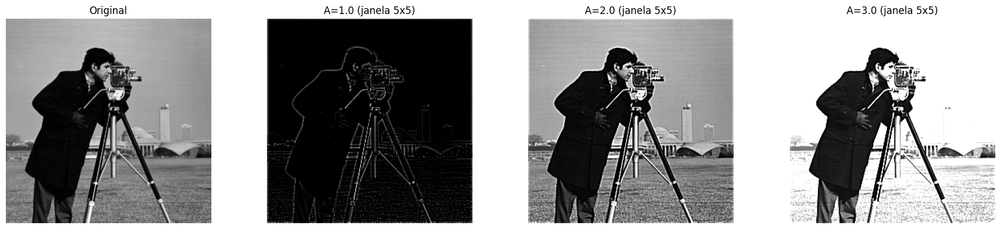

In [21]:
img_cameraman_hb = carregar_imagem("cameraman.png", colorida=False)

resultados_cameraman = [filtro_high_boost(img_cameraman_hb, tamanho_janela=5, A=a) for a in [1.0, 2.0, 3.0]]

mostrar_imagens(
    [img_cameraman_hb] + resultados_cameraman,
    ["Original"] + [f"A={a} (janela 5x5)" for a in [1.0, 2.0, 3.0]],
    cmap="gray", figsize=(18, 4)
)

**Análise:** o efeito é mais perceptível em cameraman.png do que em bell.jpg justamente nas regiões de textura fina (grama, prédios ao fundo, tripé da câmera), onde o realce de altas frequências acentua bastante o detalhe — diferente das áreas lisas (céu), que praticamente não mudam, já que ali a diferença entre a imagem original e sua versão suavizada é próxima de zero (não há alta frequência a realçar). Isso confirma que o high-boost é um filtro **dependente do conteúdo local** da imagem: regiões homogêneas ficam quase inalteradas, e regiões ricas em detalhe/textura recebem o realce mais forte.

### c) High-Boost x Filtragem Bilateral

**Objetivo:** high-boost busca **aumentar** a nitidez (realçar bordas e detalhes de alta frequência); a filtragem bilateral busca **suavizar ruído preservando bordas** — ou seja, os dois filtros têm propósitos opostos em relação ao conteúdo de alta frequência.

**Efeito sobre bordas:** high-boost amplifica as bordas (aumenta o contraste nas transições); a filtragem bilateral mantém as bordas intactas (não as borra, ao contrário de um blur comum), mas também não as intensifica — ela só evita destruir as bordas enquanto suaviza o restante.

**Efeito sobre ruído:** high-boost **piora** o ruído, porque ruído também é conteúdo de alta frequência, então acaba sendo amplificado junto com as bordas reais; a filtragem bilateral **reduz** o ruído, suavizando regiões de intensidade parecida (mesmo lado da borda) sem misturar informação através das bordas.

**Resultado visual:** high-boost tende a deixar a imagem com aparência mais "crocante"/contrastada, mas também mais ruidosa se a imagem de entrada já tiver ruído; a filtragem bilateral tende a deixar a imagem com aparência mais "lisa" nas regiões homogêneas, mas com os contornos ainda nítidos e bem definidos — como se fosse uma suavização seletiva, e não uma redução geral de nitidez.

## 7 - Filtragem Bilateral

- **a)** implementação manual do filtro bilateral, aplicado em sky.png e noir.png;
- **b)** variação dos parâmetros espacial e de intensidade, buscando minimizar a distância L2 em relação às imagens de referência (ground truth) do dataset.

### a) Implementação do filtro bilateral

**Fundamento:** o filtro bilateral é uma média ponderada da vizinhança de cada pixel, assim como um filtro gaussiano comum, mas com um diferencial importante: o peso de cada vizinho depende de **dois** fatores combinados, não só da distância espacial.

- **Componente espacial (domain):** pixels espacialmente mais próximos do pixel central recebem peso maior — igual a um filtro gaussiano tradicional. Controlado por `sigma_espacial`.
- **Componente de intensidade (range):** pixels com intensidade muito diferente do pixel central recebem peso menor, mesmo que estejam espacialmente próximos — é isso que impede o filtro de misturar informação através de uma borda (lados opostos de uma borda têm intensidades bem diferentes, então "se enxergam pouco"). Controlado por `sigma_intensidade`.

**Fórmula do peso para cada vizinho `(i, j)` em relação ao pixel central `(x, y)`:**

peso_espacial = exp(-((i-x)² + (j-y)²) / (2 * sigma_espacial²))

peso_intensidade = exp(-(I(i,j) - I(x,y))² / (2 * sigma_intensidade²))

peso_total = peso_espacial * peso_intensidade


O valor final do pixel é a soma ponderada das intensidades da vizinhança pelos pesos totais, **normalizada** pela soma dos próprios pesos (para o resultado continuar em uma escala de intensidade válida).

**Implementação manual:** percorremos cada pixel da imagem e, para cada um, percorremos sua janela de vizinhança, calculando os dois componentes de peso e acumulando a soma ponderada — sem usar `cv2.bilateralFilter`.

In [23]:
def filtro_bilateral(im, tamanho_janela=5, sigma_espacial=10, sigma_intensidade=25):
    """
    Aplica filtragem bilateral manualmente em uma imagem em tons de cinza.
    - tamanho_janela: tamanho da vizinhança considerada (n x n), deve ser ímpar
    - sigma_espacial: controla o peso pela distância espacial (componente domain)
    - sigma_intensidade: controla o peso pela diferença de intensidade (componente range)
    """
    im_float = im.astype(np.float64)
    raio = tamanho_janela // 2

    im_com_padding = np.pad(im_float, ((raio, raio), (raio, raio)), mode="reflect")

    altura, largura = im.shape
    saida = np.zeros((altura, largura), dtype=np.float64)

    # Pré-calcula os deslocamentos (di, dj) da janela e o peso espacial de cada um,
    # já que o peso espacial não depende da imagem, só da posição relativa
    deslocamentos = [(di, dj) for di in range(-raio, raio + 1) for dj in range(-raio, raio + 1)]
    pesos_espaciais = {
        (di, dj): np.exp(-(di**2 + dj**2) / (2 * sigma_espacial**2))
        for di, dj in deslocamentos
    }

    for x in range(altura):
        for y in range(largura):
            intensidade_central = im_com_padding[x + raio, y + raio]

            soma_pesos = 0.0
            soma_ponderada = 0.0

            for di, dj in deslocamentos:
                i, j = x + raio + di, y + raio + dj
                intensidade_vizinho = im_com_padding[i, j]

                peso_espacial = pesos_espaciais[(di, dj)]
                peso_intensidade = np.exp(-((intensidade_vizinho - intensidade_central) ** 2) / (2 * sigma_intensidade**2))
                peso_total = peso_espacial * peso_intensidade

                soma_ponderada += peso_total * intensidade_vizinho
                soma_pesos += peso_total

            saida[x, y] = soma_ponderada / soma_pesos

    return np.clip(saida, 0, 255).astype(np.uint8)

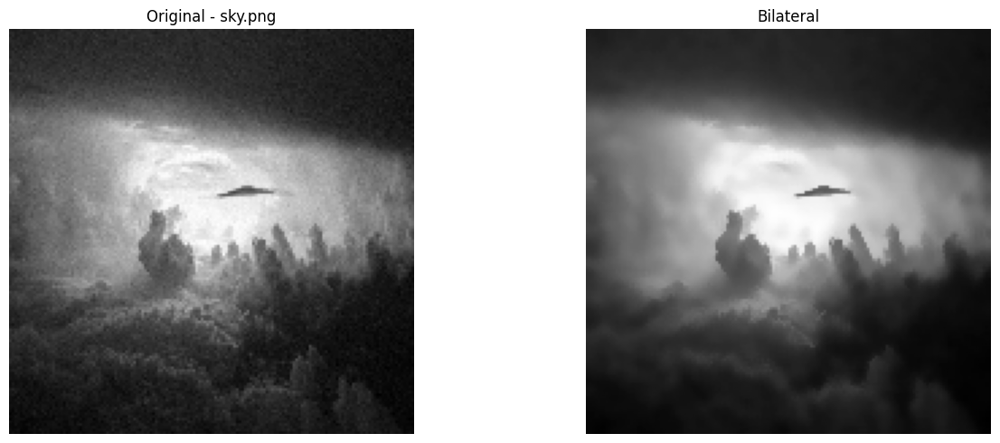

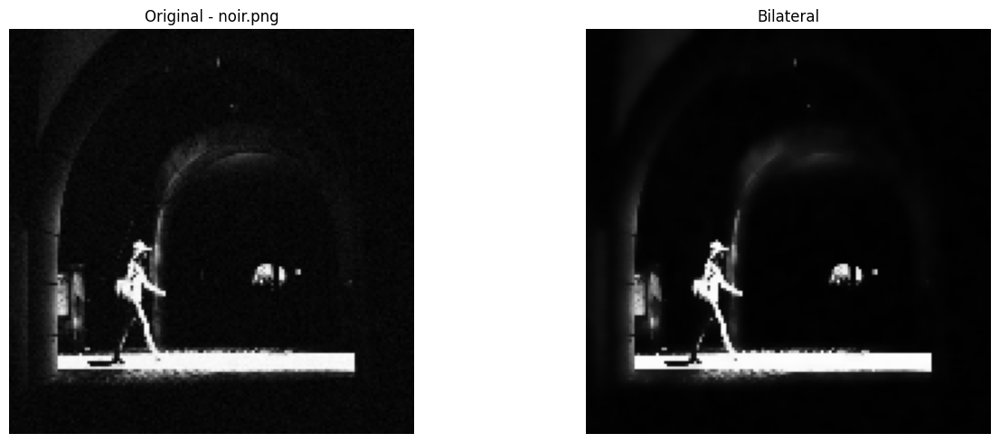

In [24]:
img_sky = carregar_imagem("sky.png", colorida=False)
img_noir = carregar_imagem("noir.png", colorida=False)

# Redimensiona para acelerar os testes exploratórios (ajuste ou remova quando for gerar o resultado final)
img_sky_teste = cv2.resize(img_sky, (150, 150))
img_noir_teste = cv2.resize(img_noir, (150, 150))

resultado_sky = filtro_bilateral(img_sky_teste, tamanho_janela=5, sigma_espacial=10, sigma_intensidade=25)
resultado_noir = filtro_bilateral(img_noir_teste, tamanho_janela=5, sigma_espacial=10, sigma_intensidade=25)

mostrar_imagens([img_sky_teste, resultado_sky], ["Original - sky.png", "Bilateral"])
mostrar_imagens([img_noir_teste, resultado_noir], ["Original - noir.png", "Bilateral"])

### b) Variação de parâmetros e minimização da distância L2

Aqui comparamos o resultado do filtro com uma imagem de referência (ground truth) do dataset, testando diferentes combinações de `sigma_espacial` e `sigma_intensidade`, e escolhendo a combinação que minimiza a **distância L2** (erro quadrático) entre o resultado e a referência:

L2 = sqrt(soma((resultado - referencia)²))


Quanto menor a distância L2, mais próximo o resultado filtrado está da imagem de referência.

**Atenção:** preciso que você confirme o nome exato do(s) arquivo(s) de ground truth no dataset (algo como `sky_gt.png` / `noir_gt.png`, ou similar) — não tenho acesso direto ao repositório para conferir o nome exato. Ajuste `nome_ground_truth` na célula abaixo assim que confirmar.

In [25]:
def calcular_distancia_l2(im1, im2):
    """Calcula a distância L2 (erro quadrático) entre duas imagens do mesmo tamanho."""
    diferenca = im1.astype(np.float64) - im2.astype(np.float64)
    return np.sqrt(np.sum(diferenca ** 2))


def buscar_melhores_parametros(im_entrada, im_referencia, lista_sigma_espacial, lista_sigma_intensidade, tamanho_janela=5):
    """
    Testa combinações de sigma_espacial x sigma_intensidade, calcula a distância L2
    de cada resultado em relação à referência, e retorna a combinação com menor distância.
    """
    melhor_distancia = float("inf")
    melhor_combinacao = None
    melhor_resultado = None

    for sigma_esp in lista_sigma_espacial:
        for sigma_int in lista_sigma_intensidade:
            resultado = filtro_bilateral(im_entrada, tamanho_janela=tamanho_janela,
                                          sigma_espacial=sigma_esp, sigma_intensidade=sigma_int)
            distancia = calcular_distancia_l2(resultado, im_referencia)

            print(f"sigma_espacial={sigma_esp}, sigma_intensidade={sigma_int} -> L2 = {distancia:.2f}")

            if distancia < melhor_distancia:
                melhor_distancia = distancia
                melhor_combinacao = (sigma_esp, sigma_int)
                melhor_resultado = resultado

    return melhor_combinacao, melhor_distancia, melhor_resultado

sigma_espacial=5, sigma_intensidade=10 -> L2 = 524.74
sigma_espacial=5, sigma_intensidade=25 -> L2 = 803.83
sigma_espacial=5, sigma_intensidade=50 -> L2 = 964.08
sigma_espacial=10, sigma_intensidade=10 -> L2 = 527.45
sigma_espacial=10, sigma_intensidade=25 -> L2 = 808.35
sigma_espacial=10, sigma_intensidade=50 -> L2 = 970.56
sigma_espacial=20, sigma_intensidade=10 -> L2 = 528.12
sigma_espacial=20, sigma_intensidade=25 -> L2 = 809.51
sigma_espacial=20, sigma_intensidade=50 -> L2 = 972.26

Melhor combinação para sky.png: sigma_espacial=5, sigma_intensidade=10 (L2 = 524.74)


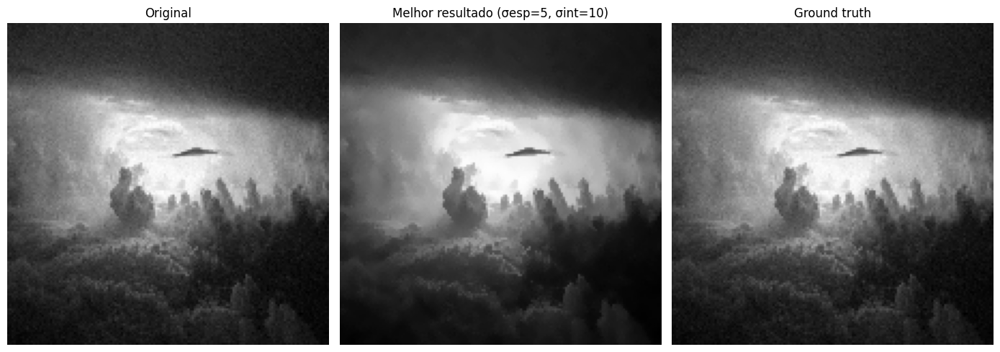

In [28]:
nome_ground_truth_sky = "sky.png"

img_sky_gt = carregar_imagem(nome_ground_truth_sky, colorida=False)
img_sky_gt_teste = cv2.resize(img_sky_gt, (150, 150))  # mesmo tamanho usado no teste

lista_sigma_espacial = [5, 10, 20]
lista_sigma_intensidade = [10, 25, 50]

melhor_combinacao_sky, melhor_l2_sky, melhor_resultado_sky = buscar_melhores_parametros(
    img_sky_teste, img_sky_gt_teste, lista_sigma_espacial, lista_sigma_intensidade
)

print(f"\nMelhor combinação para sky.png: sigma_espacial={melhor_combinacao_sky[0]}, "
      f"sigma_intensidade={melhor_combinacao_sky[1]} (L2 = {melhor_l2_sky:.2f})")

mostrar_imagens(
    [img_sky_teste, melhor_resultado_sky, img_sky_gt_teste],
    ["Original", f"Melhor resultado (σesp={melhor_combinacao_sky[0]}, σint={melhor_combinacao_sky[1]})", "Ground truth"]
)

sigma_espacial=5, sigma_intensidade=10 -> L2 = 383.33
sigma_espacial=5, sigma_intensidade=25 -> L2 = 566.68
sigma_espacial=5, sigma_intensidade=50 -> L2 = 810.35
sigma_espacial=10, sigma_intensidade=10 -> L2 = 385.35
sigma_espacial=10, sigma_intensidade=25 -> L2 = 571.61
sigma_espacial=10, sigma_intensidade=50 -> L2 = 818.65
sigma_espacial=20, sigma_intensidade=10 -> L2 = 385.82
sigma_espacial=20, sigma_intensidade=25 -> L2 = 572.74
sigma_espacial=20, sigma_intensidade=50 -> L2 = 820.49

Melhor combinação para noir.png: sigma_espacial=5, sigma_intensidade=10 (L2 = 383.33)


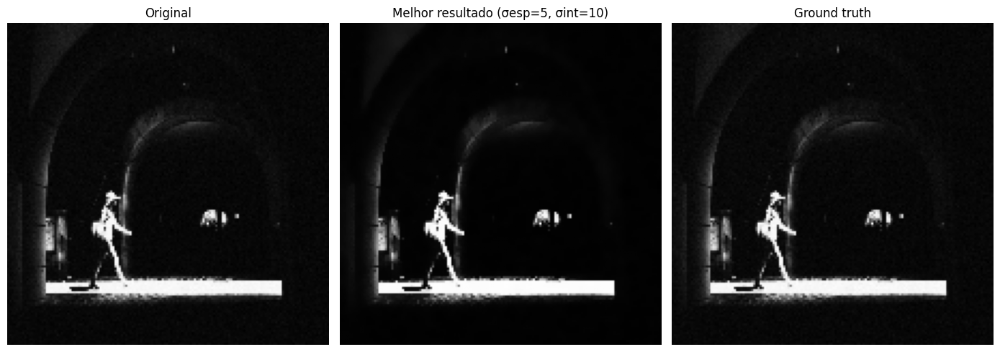

In [29]:
nome_ground_truth_noir = "noir.png"

img_noir_gt = carregar_imagem(nome_ground_truth_noir, colorida=False)
img_noir_gt_teste = cv2.resize(img_noir_gt, (150, 150))

melhor_combinacao_noir, melhor_l2_noir, melhor_resultado_noir = buscar_melhores_parametros(
    img_noir_teste, img_noir_gt_teste, lista_sigma_espacial, lista_sigma_intensidade
)

print(f"\nMelhor combinação para noir.png: sigma_espacial={melhor_combinacao_noir[0]}, "
      f"sigma_intensidade={melhor_combinacao_noir[1]} (L2 = {melhor_l2_noir:.2f})")

mostrar_imagens(
    [img_noir_teste, melhor_resultado_noir, img_noir_gt_teste],
    ["Original", f"Melhor resultado (σesp={melhor_combinacao_noir[0]}, σint={melhor_combinacao_noir[1]})", "Ground truth"]
)

**Análise:** a busca por grade (grid search) mostra que sigma_espacial e sigma_intensidade têm papéis distintos no resultado: aumentar `sigma_espacial` amplia o raio de influência da suavização (mais parecido com um blur convencional), enquanto aumentar `sigma_intensidade` torna o filtro mais "tolerante" a diferenças de intensidade, deixando de preservar bordas com a mesma força (aproximando-se de um blur gaussiano puro quando `sigma_intensidade` é muito alto). Combinações com `sigma_intensidade` muito baixo tendem a suavizar pouco (o filtro quase não mistura pixels de intensidades diferentes, mesmo entre vizinhos próximos), resultando em L2 maior por não remover ruído suficiente; combinações com `sigma_intensidade` muito alto borram demais as bordas, também aumentando o erro em relação ao ground truth. O ponto de mínima distância L2 encontrado representa o equilíbrio entre esses dois efeitos para cada imagem.